In [1]:
%run ../scripts/notebook_settings_lean.py
from scipy import stats
from horizonplot import horizonplot
from chromwindow import window

In [2]:
def create_paint_df_ind_compressed(df, ind, mapping, ns_map):
    d = {}
    max_pos = int(df.epos.iloc[-1])
    df = df.loc[df[ind].shift() != df[ind]].reset_index()
    df["epos"] = pd.concat([df.spos.iloc[1:], pd.Series(max_pos)], ignore_index=True)
    d["pos"] = df.spos
    d["end_pos"] = df.epos -1
    d["length"] = df.epos - df.spos
    d["reference"] = df[ind].map(mapping)
    d["n/s"] = d["reference"].map(ns_map)
    d["individual"] = ind[:-2]
    d["haplotype"] = ind[-1:]
    return pd.DataFrame(d)

def create_paint_df_ind(df, ind, mapping, ns_map):
    d = {}
    d["pos"] = df.spos
    d["end_pos"] = df.epos -1
    d["length"] = df.epos - df.spos
    d["reference"] = df[ind].map(mapping)
    d["n/s"] = d["reference"].map(ns_map)
    d["individual"] = ind[:-2]
    d["haplotype"] = ind[-1:]
    return pd.DataFrame(d)

In [3]:
meta_data_samples = pd.read_csv("../data/Papio_metadata_with_clustering_sci.txt", sep =" ")
rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/"
mapping_df = pd.read_csv(rfmix_path + "ref_names.txt", sep = "\t", names=["ID", "Origin"])

pop_mapping = {}
o_order = sorted((mapping_df.Origin.unique()))
for o in range(len((mapping_df.Origin.unique()))):
    pop_mapping[o_order[o]] = o

north_south_mapping = {'Hamadryas, Ethiopia': 1,
 'Kindae, Zambia': 0,
 'Papio, Senegal': 1,
 'Ursinus, Zambia': 0}

In [4]:
df_l = []
for chrom in ["chr{}".format(x) for x in (range(1, 21))]+["all_chrX", "female_chrX"]:
    print(chrom)
    input_file = rfmix_path + "{}.msp.tsv".format(chrom)
    chr_df = pd.read_csv(input_file, sep = "\t", header=1)
    file = open(input_file, 'r')
    line1 = file.readline()
    file.close()
    number_subpop_mapping = {}
    for subpop in line1.strip().split("\t"):
        # Splitting to create lists containing two values - subpop and number.
        subpop_number = subpop.split(": ")[-1].split("=")
        number_subpop_mapping[int(subpop_number[1])] = subpop_number[0]
    for hap in chr_df.columns[6:]:
        paint_df = create_paint_df_ind_compressed(chr_df, hap, number_subpop_mapping, north_south_mapping)
        paint_df["chrom"] = "{}".format(chrom)
        df_l.append(paint_df)
length_df = pd.concat(df_l)

chr1
chr2
chr3
chr4
chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20
all_chrX
female_chrX


In [5]:
length_df["haplo_ID"] = length_df.individual +"_"+ length_df.haplotype
length_df["start"] = length_df.pos
length_df["north"] = length_df["n/s"]*2-1
length_df["total_north"] = length_df["north"]*length_df.length
length_df

,pos,end_pos,length,reference,n/s,individual,haplotype,chrom,haplo_ID,start,north,total_north
0,160,9915383,9915224,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,160,-1,-9915224
1,9915384,10291147,375764,"Hamadryas, Ethiopia",1,Sci_16066,0,chr1,Sci_16066_0,9915384,1,375764
2,10291148,33224041,22932894,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,10291148,-1,-22932894
3,33224042,33578534,354493,"Hamadryas, Ethiopia",1,Sci_16066,0,chr1,Sci_16066_0,33224042,1,354493
4,33578535,39239117,5660583,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,33578535,-1,-5660583
...,...,...,...,...,...,...,...,...,...,...,...,...
36,132084938,134178575,2093638,"Kindae, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,132084938,-1,-2093638
37,134178576,141491629,7313054,"Ursinus, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,134178576,-1,-7313054
38,141491630,141642617,150988,"Papio, Senegal",1,PD_0774,1,female_chrX,PD_0774_1,141491630,1,150988
39,141642618,142762281,1119664,"Ursinus, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,141642618,-1,-1119664


In [6]:
total_sort = (length_df.groupby(by=["haplo_ID", "individual"])[["total_north"]].sum()).sort_values(by="total_north",
                                                                          ascending=False).reset_index()

In [7]:
total_sort

,haplo_ID,individual,total_north
0,PD_0736_0,PD_0736,2875939737
1,PD_0738_0,PD_0738,2875755101
2,PD_0738_1,PD_0738,2875218831
3,PD_0724_0,PD_0724,2875131363
4,PD_0726_1,PD_0726,2874750385
...,...,...,...
307,PD_0754_1,PD_0754,-2814294119
308,PD_0272_0,PD_0272,-2816915327
309,PD_0272_1,PD_0272,-2820771717
310,PD_0237_0,PD_0237,-2834306183


In [8]:
tanzania = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Cynocephalus, Central Tanzania",
                                                                "Anubis, Tanzania",
                                                                "Cynocephalus, Western Tanzania"])].PGDP_ID
olive = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Anubis, Tanzania"])].PGDP_ID
eth = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Anubis, Ethiopia"])].PGDP_ID
yellow = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Cynocephalus, Central Tanzania",
                                                                "Cynocephalus, Western Tanzania"])].PGDP_ID
western = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Cynocephalus, Western Tanzania"])].PGDP_ID
ruaha = meta_data_samples.loc[meta_data_samples.Origin == "Ruaha, Tanzania"].PGDP_ID

In [11]:
length_df

,pos,end_pos,length,reference,n/s,individual,haplotype,chrom,haplo_ID,start,north,total_north
0,160,9915383,9915224,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,160,-1,-9915224
1,9915384,10291147,375764,"Hamadryas, Ethiopia",1,Sci_16066,0,chr1,Sci_16066_0,9915384,1,375764
2,10291148,33224041,22932894,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,10291148,-1,-22932894
3,33224042,33578534,354493,"Hamadryas, Ethiopia",1,Sci_16066,0,chr1,Sci_16066_0,33224042,1,354493
4,33578535,39239117,5660583,"Kindae, Zambia",0,Sci_16066,0,chr1,Sci_16066_0,33578535,-1,-5660583
...,...,...,...,...,...,...,...,...,...,...,...,...
36,132084938,134178575,2093638,"Kindae, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,132084938,-1,-2093638
37,134178576,141491629,7313054,"Ursinus, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,134178576,-1,-7313054
38,141491630,141642617,150988,"Papio, Senegal",1,PD_0774,1,female_chrX,PD_0774_1,141491630,1,150988
39,141642618,142762281,1119664,"Ursinus, Zambia",0,PD_0774,1,female_chrX,PD_0774_1,141642618,-1,-1119664


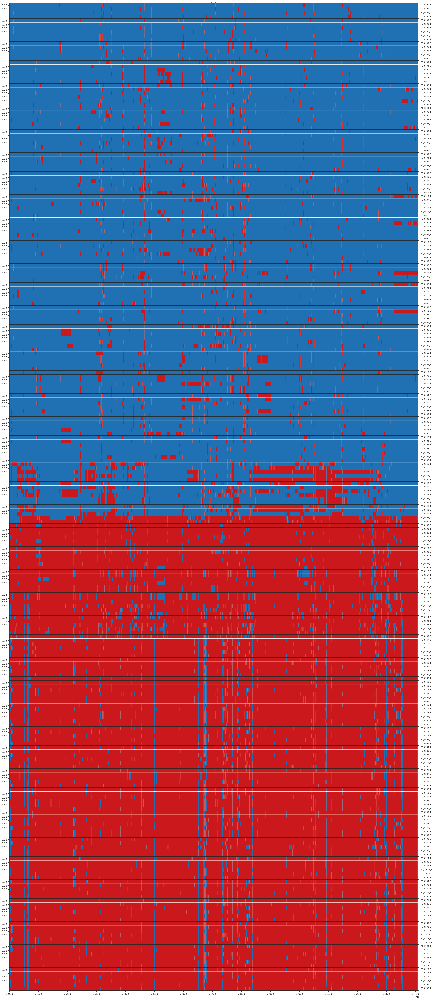

In [10]:
chr_l_df = length_df.loc[(length_df.chrom == "all_chrX") & (length_df.individual.isin(tanzania))]
fig = horizonplot(chr_l_df, 'north', width=2, col='chrom', row='haplo_ID', size=0.3, aspect=100,
                 pop_sorting=total_sort.loc[total_sort.individual.isin(tanzania)].haplo_ID)

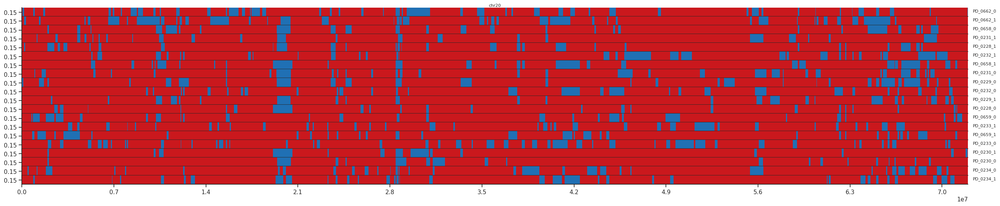

In [12]:
chr_l_df = length_df.loc[(length_df.chrom == "chr20") & (length_df.individual.isin(western))]
fig = horizonplot(chr_l_df, 'north', width=1, col='chrom', row='haplo_ID', size=0.3, aspect=100,
                 pop_sorting=total_sort.loc[total_sort.individual.isin(western)].haplo_ID)

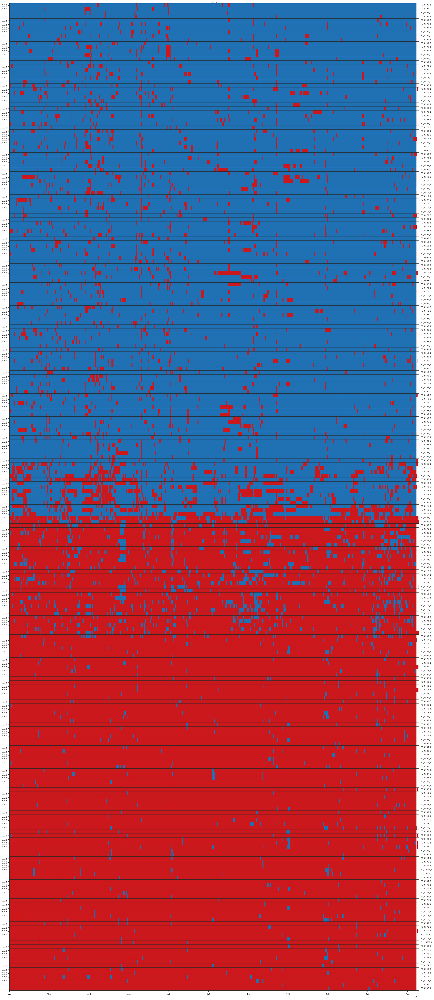

In [14]:
chr_l_df = length_df.loc[(length_df.chrom == "chr20") & (length_df.individual.isin(tanzania))]
fig = horizonplot(chr_l_df, 'north', width=1, col='chrom', row='haplo_ID', size=0.3, aspect=100,
                 pop_sorting=total_sort.loc[total_sort.individual.isin(tanzania)].haplo_ID)

In [15]:
chr_l_df = length_df.loc[(length_df.chrom == "chr20") & (length_df.individual.isin(tanzania))]
chr_l_df.to_csv("../steps/rfmix_gen100/tanzania_focus/chr20_test.txt", index=False)

In [54]:
chr_l_df.loc[chr_l_df.pos == chr_l_df.pos.max()]

,pos,end_pos,length,reference,n/s,individual,haplotype,chrom,haplo_ID,start,north,total_north
88,71996235,72046086,49852,"Kindae, Zambia",0,PD_0207,1,chr20,PD_0207_1,71996235,-1,-49852


In [53]:
len(chr_l_df.haplo_ID.unique())

258

In [ ]:
chr_l_df = length_df.loc[(length_df.chrom == "all_chrX") & (length_df.individual.isin(tanzania))]
fig = horizonplot(chr_l_df, 'north', width=2, col='chrom', row='haplo_ID', size=0.3, aspect=100)

In [6]:
@window(size=100000)
def north_sum(df):
    return (df.end-df.start).sum()

def add_dummy(c_df):
    inds = c_df.individual.unique()
    dummy_df = pd.DataFrame({"individual": np.repeat(inds, 2)})
    dummy_df["haplotype"] = pd.Series(["0", "1"]*len(inds))
    dummy_df["end"], dummy_df["start"] = c_df.end.max(), c_df.end.max()
    dummy_df["chrom"] = c_df.chrom.unique()[0]
    return dummy_df

rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/"
df_l = []

for c in length_df.chrom.unique():
    output_file = rfmix_path + "{}.windows.txt".format(c)
    print(output_file)
    if os.path.exists(output_file) == False:
        c_df = length_df.loc[(length_df.chrom == c) & (length_df["n/s"] == 1)]
        c_df = c_df.rename(columns={"pos": "start", "end_pos": "end"})
        dummy_added = pd.concat([c_df, add_dummy(c_df)]).reset_index()
        df = dummy_added.groupby(['chrom', 'individual', 'haplotype'])[["end", "start"]].apply(north_sum).reset_index(drop=True, level=-1).reset_index()
        df.to_csv(output_file, index=False, sep="\t")

/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr1.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr2.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr3.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr4.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr5.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr6.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr7.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/tanzania_focus/chr8.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/r

In [7]:
df_l = []
for c in length_df.chrom.unique():
    read_file = rfmix_path + "{}.windows.txt".format(c)
    df = pd.read_csv(read_file, sep="\t")
    df_l.append(df)
window_df = pd.concat(df_l)

In [8]:
window_df.loc[window_df.end == 100000]

,chrom,individual,haplotype,start,end,north_sum
0,chr1,PD_0199,0,0,100000,99840
2175,chr1,PD_0199,1,0,100000,99840
4350,chr1,PD_0200,0,0,100000,99840
6525,chr1,PD_0200,1,0,100000,99840
8700,chr1,PD_0201,0,0,100000,99840
...,...,...,...,...,...,...
211239,female_chrX,Sci_16066,1,0,100000,0
212676,female_chrX,Sci_16098,0,0,100000,0
214113,female_chrX,Sci_16098,1,0,100000,0
215550,female_chrX,Sci_30977,0,0,100000,99963


In [9]:
x_df = window_df.loc[window_df.chrom.isin(["all_chrX"])]
autosomal_df = window_df.loc[~window_df.chrom.isin(["all_chrX", "female_chrX"])]

x_length = x_df.loc[x_df.individual == "PD_0199"].end.max()
percentage_north_x = ((x_df.groupby(by=["individual"])[["north_sum"]].sum())/(2*x_length))

aut_length = (autosomal_df.loc[autosomal_df.individual == "PD_0199"].end - \
              autosomal_df.loc[autosomal_df.individual == "PD_0199"].start).sum()
percentage_north_aut = ((autosomal_df.groupby(by=["individual"])[["north_sum"]].sum())/(aut_length))

x_aut_percent = percentage_north_x.merge(right=percentage_north_aut, on="individual")
sort_aut_x = x_aut_percent.sort_values(by="north_sum_y", ascending=False).reset_index()
aut_sort = sort_aut_x[["individual", "north_sum_y"]]
aut_sort = aut_sort.rename(columns={"north_sum_y": "North Percentage"})
aut_sort["chrom"] = "autosome"
x_sort = sort_aut_x[["individual", "north_sum_x"]]
x_sort = x_sort.rename(columns={"north_sum_x": "North Percentage"})
x_sort["chrom"] = "chrX"
concat_df = pd.concat([aut_sort, x_sort])

In [10]:
concat_df

,individual,North Percentage,chrom
0,PD_0202,0.969261,autosome
1,PD_0203,0.967011,autosome
2,PD_0199,0.966740,autosome
3,PD_0200,0.964175,autosome
4,PD_0201,0.962700,autosome
...,...,...,...
150,PD_0755,0.063212,chrX
151,PD_0272,0.056754,chrX
152,PD_0237,0.043484,chrX
153,PD_0236,0.046699,chrX


In [11]:
tanzania = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Cynocephalus, Central Tanzania",
                                                                "Anubis, Tanzania",
                                                                "Cynocephalus, Western Tanzania"])].PGDP_ID
olive = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Anubis, Tanzania"])].PGDP_ID
eth = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Anubis, Ethiopia"])].PGDP_ID
yellow = meta_data_samples.loc[meta_data_samples.C_origin.isin(["Cynocephalus, Central Tanzania",
                                                                "Cynocephalus, Western Tanzania"])].PGDP_ID
ruaha = meta_data_samples.loc[meta_data_samples.Origin == "Ruaha, Tanzania"].PGDP_ID

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


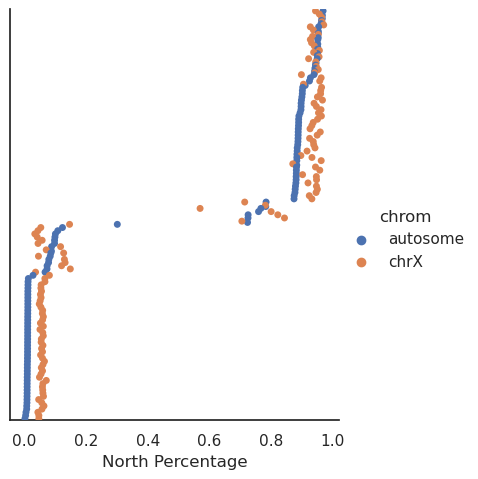

In [12]:
tanz_subset = concat_df.loc[concat_df.individual.isin(tanzania)]
ax = sns.catplot(data=tanz_subset, x="North Percentage", y="individual", hue="chrom", kind="swarm", legend_out=False)
ax.set(yticks=[], ylabel=None)

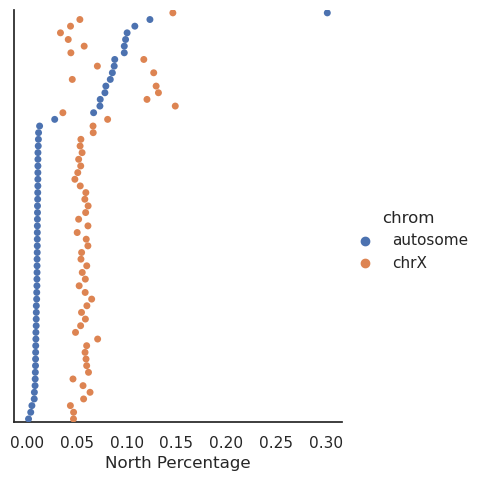

In [13]:
sub_con = concat_df.loc[(concat_df["North Percentage"] < 0.5)]
ax = sns.catplot(data=sub_con, x="North Percentage", y="individual", hue="chrom", kind="swarm", legend_out=False)
ax.set(yticks=[], ylabel=None)

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.8/site-packages/seaborn/categorical.py:3544: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


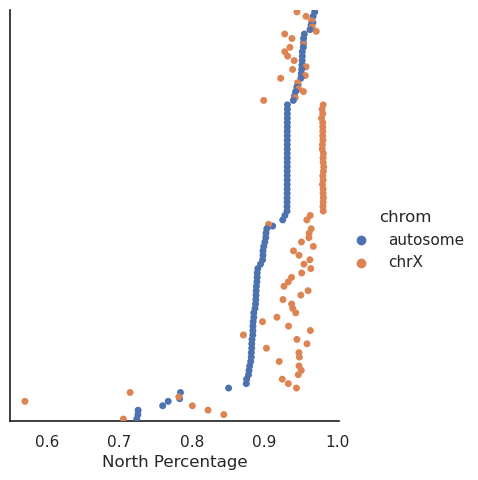

In [14]:
sub_con = concat_df.loc[(concat_df["North Percentage"] > 0.5)]
ax = sns.catplot(data=sub_con, x="North Percentage", y="individual", hue="chrom", kind="swarm", legend_out=False)
ax.set(yticks=[], ylabel=None)

/home/eriks/miniconda3/envs/baboondiversity/lib/python3.8/site-packages/seaborn/axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


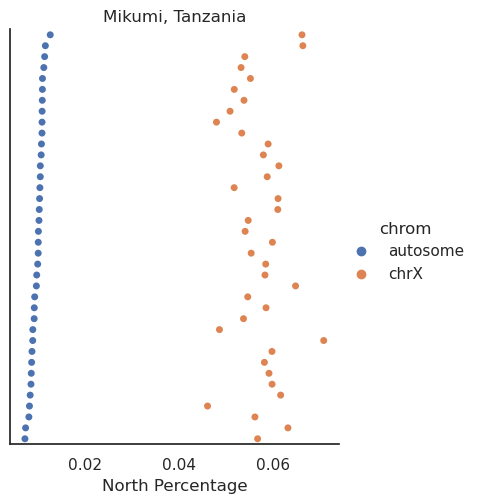

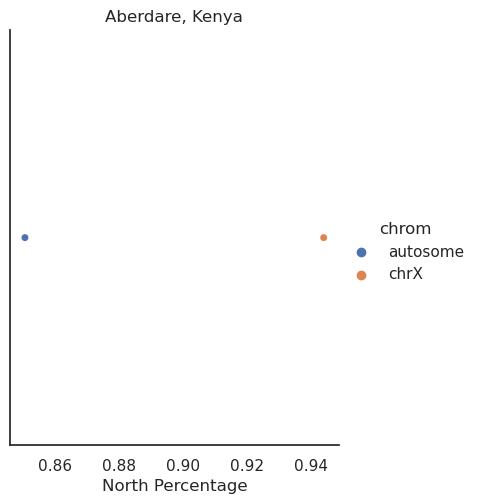

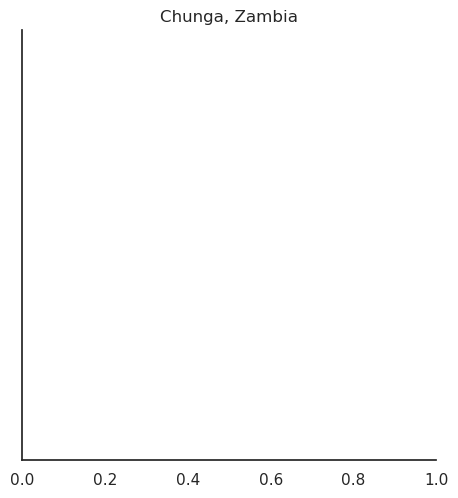

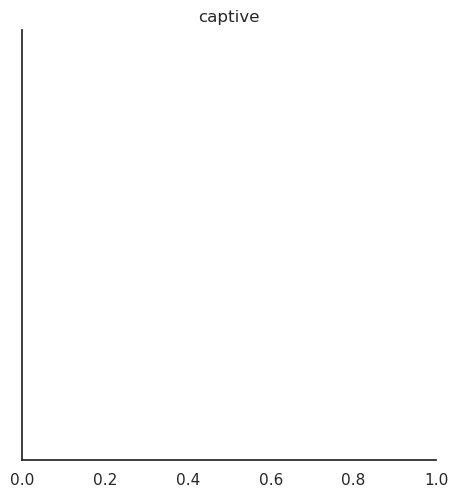

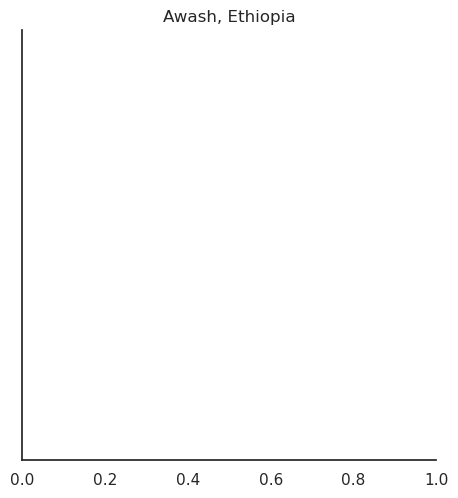

...

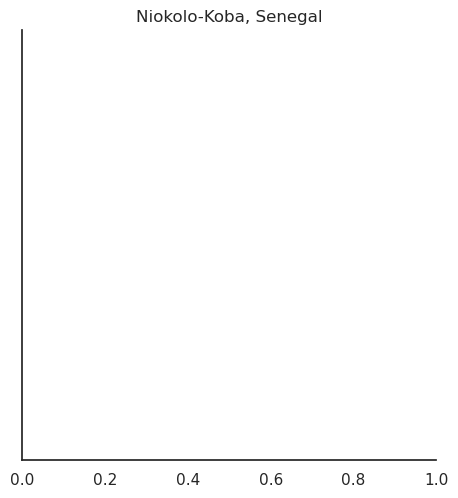

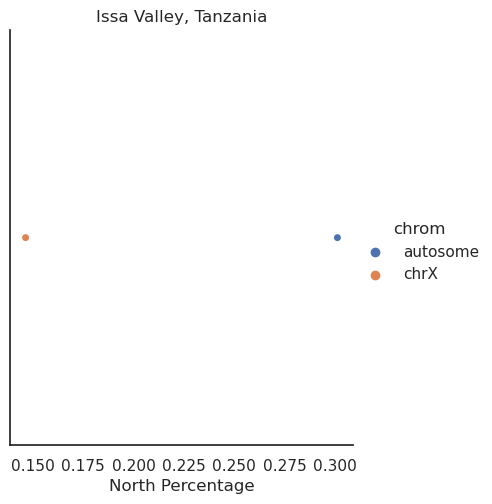

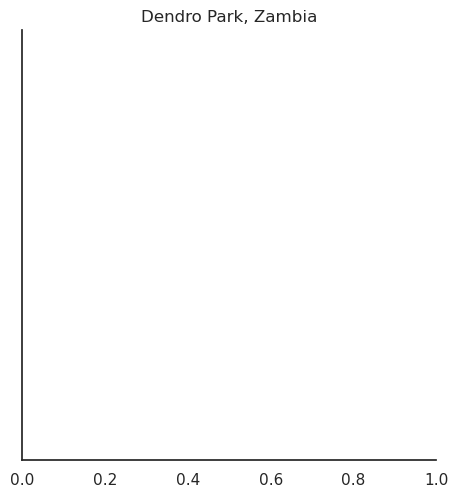

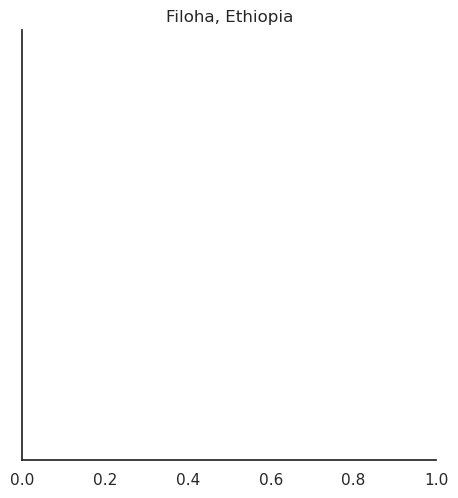

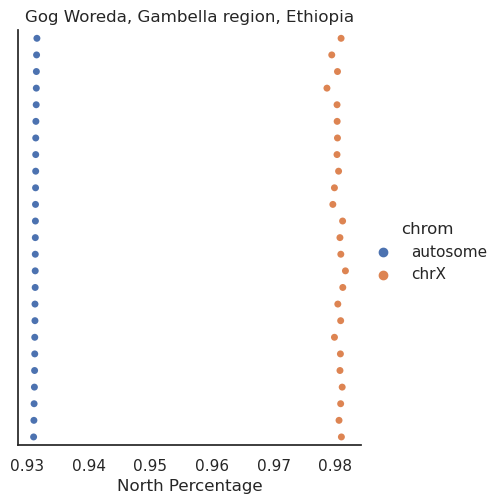

In [15]:
for o in meta_data_samples.Origin.unique():
    sub_con = concat_df.loc[concat_df.individual.isin(meta_data_samples.loc[meta_data_samples.Origin == o].PGDP_ID)]
    ax = sns.catplot(data=sub_con, x="North Percentage", y="individual", hue="chrom", kind="swarm")
    ax.set(yticks=[], ylabel=None, title=o)

In [16]:
mean_df = window_df.groupby(by=["individual", "chrom", "start"])[["north_sum"]].mean().reset_index()
mean_df["north"] = (mean_df.north_sum*2)-100000

In [17]:
aut_sort.loc[aut_sort.individual.isin(yellow)].individual

93     PD_0662
94     PD_0232
95     PD_0659
96     PD_0231
97     PD_0228
        ...   
150    PD_0755
151    PD_0272
152    PD_0237
153    PD_0236
154    PD_0235
Name: individual, Length: 62, dtype: object

Done


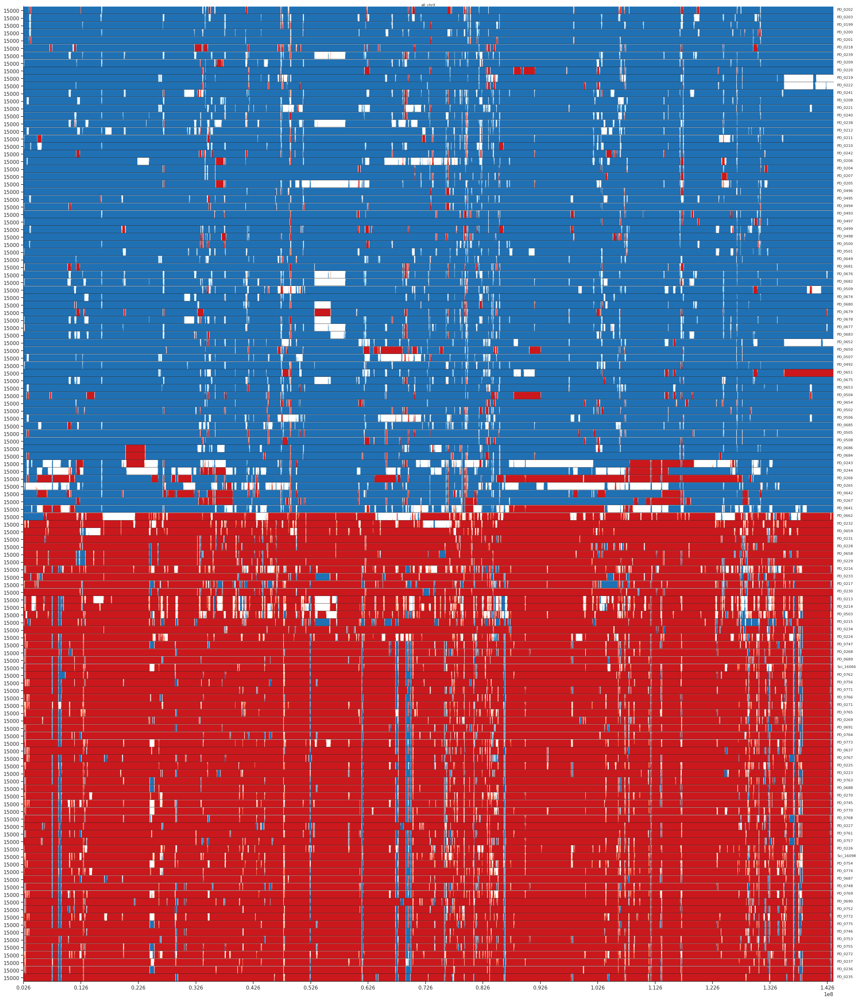

In [19]:
chrtest = mean_df.loc[(mean_df.chrom == "all_chrX") & (mean_df.individual.isin(tanzania) &
                                                      (mean_df.start > 2500000))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

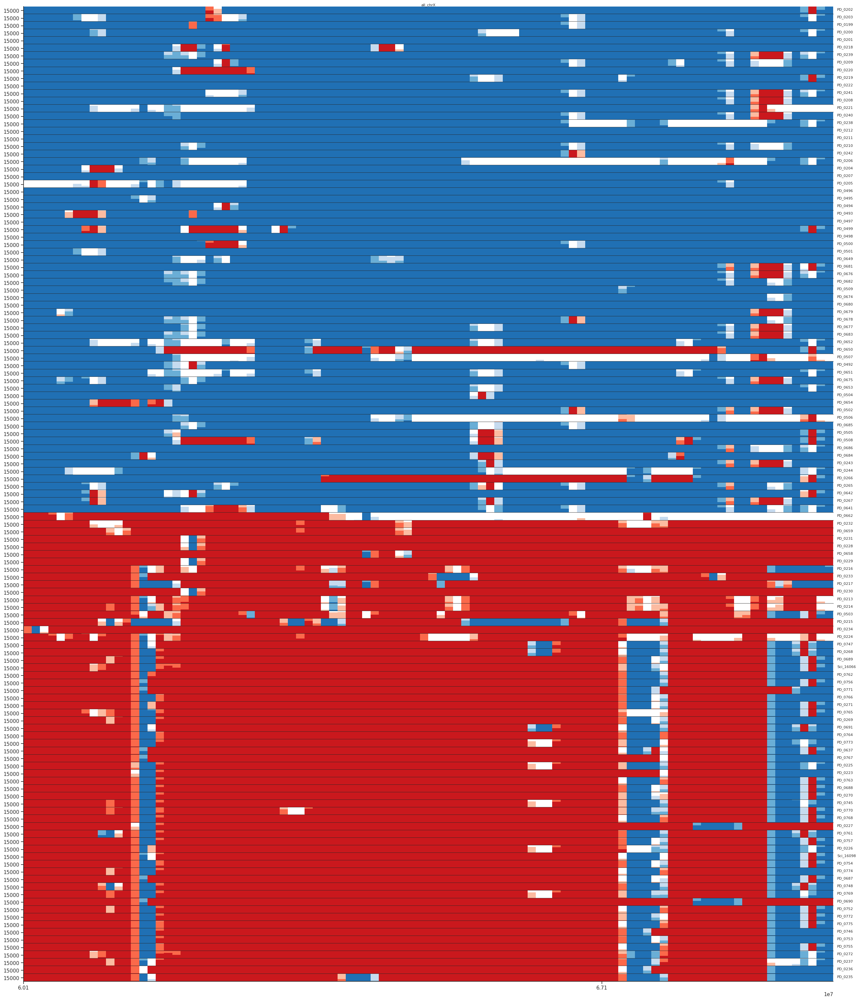

In [22]:
chrtest = mean_df.loc[(mean_df.chrom == "all_chrX") & (mean_df.individual.isin(tanzania)) &
                    (mean_df.start > 60000000) & (mean_df.start < 70000000)]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)

Done


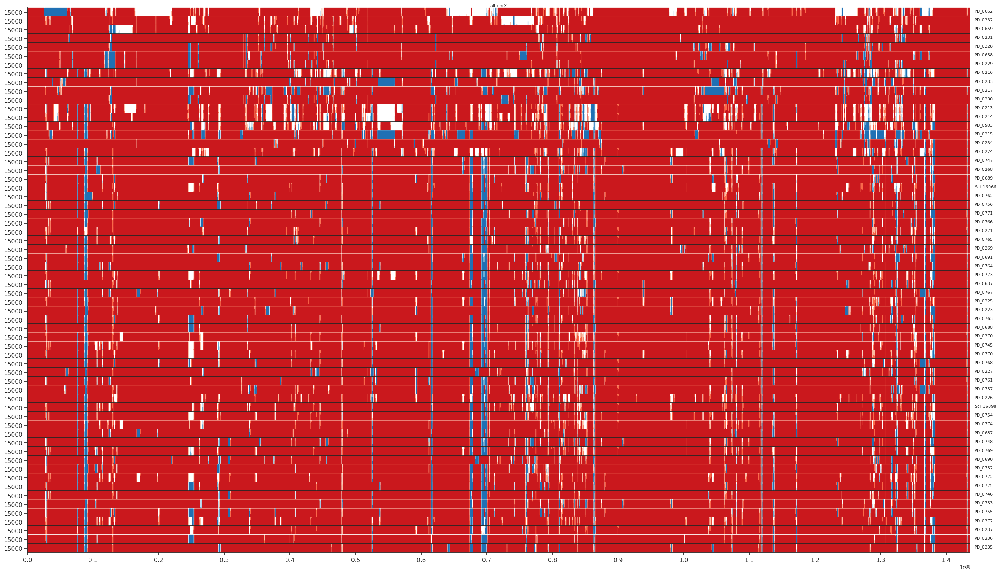

In [20]:
chrtest = mean_df.loc[(mean_df.chrom == "all_chrX") & (mean_df.individual.isin(yellow))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(yellow)].individual)
print("Done")

Done


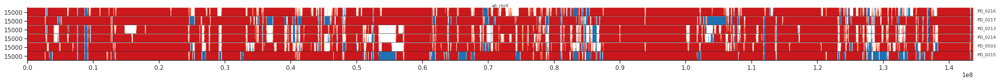

In [21]:
chrtest = mean_df.loc[(mean_df.chrom == "all_chrX") & (mean_df.individual.isin(ruaha))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(ruaha)].individual)
print("Done")

Done


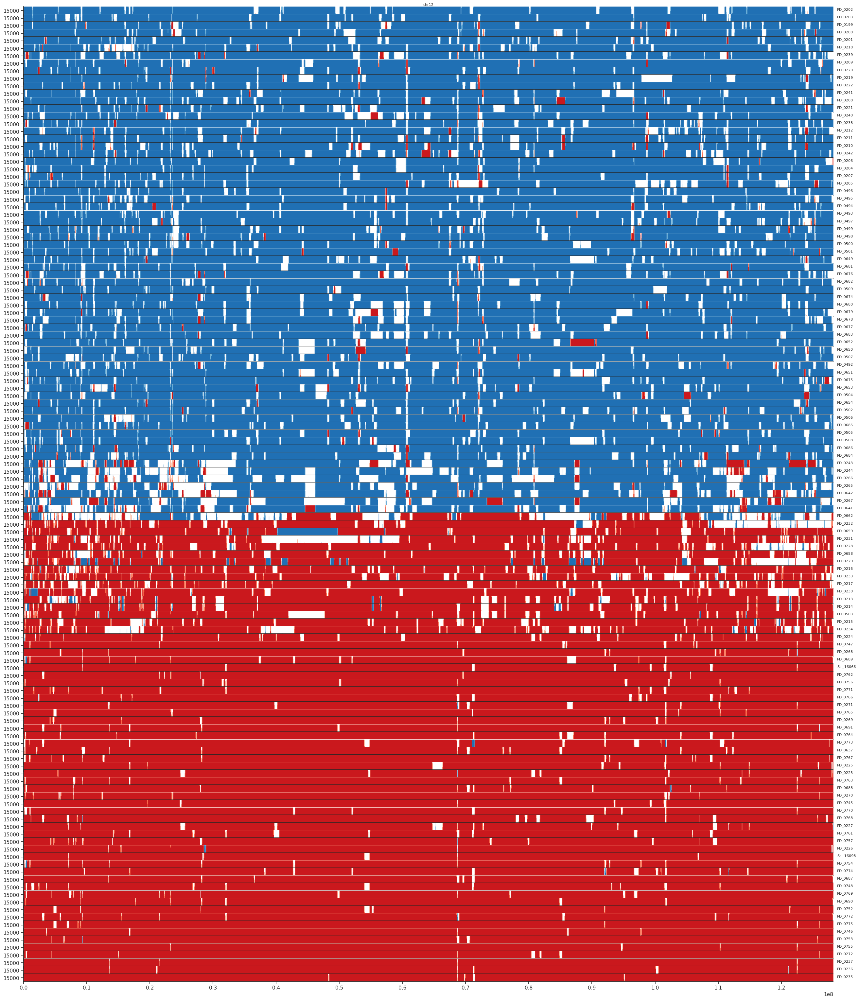

In [34]:
chrtest = mean_df.loc[(mean_df.chrom == "chr12") & (mean_df.individual.isin(tanzania))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

Done


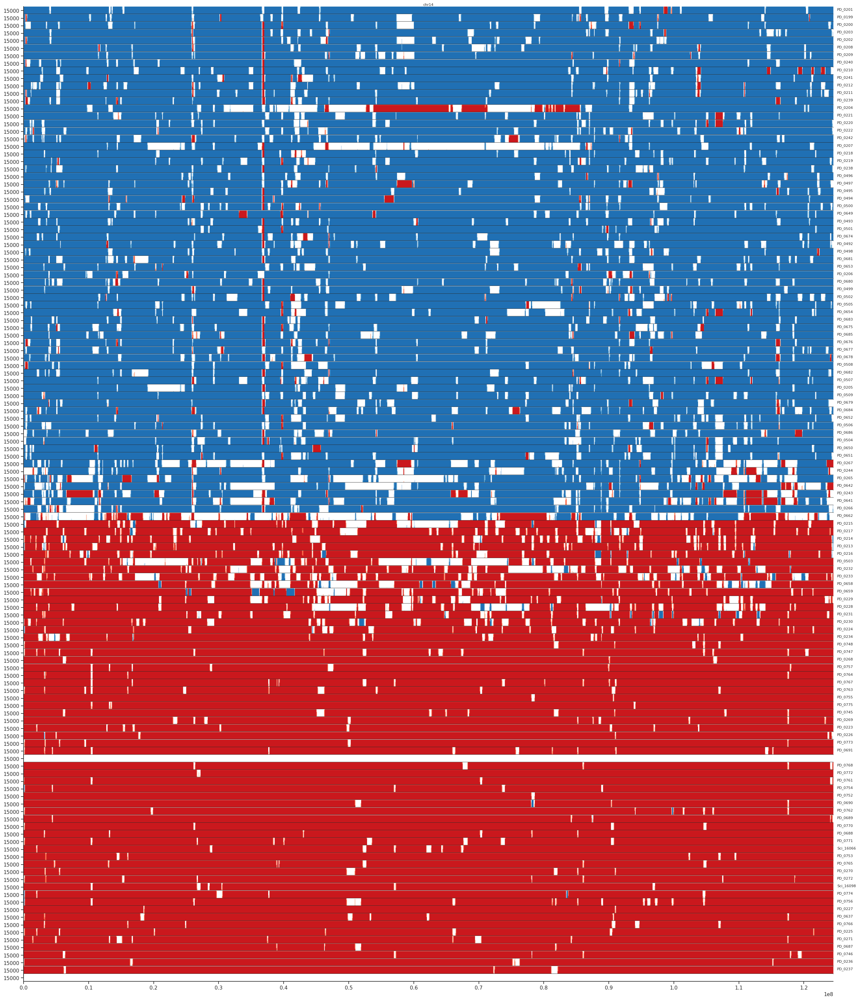

In [21]:
chrtest = mean_df.loc[(mean_df.chrom == "chr14") & (mean_df.individual.isin(tanzania))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

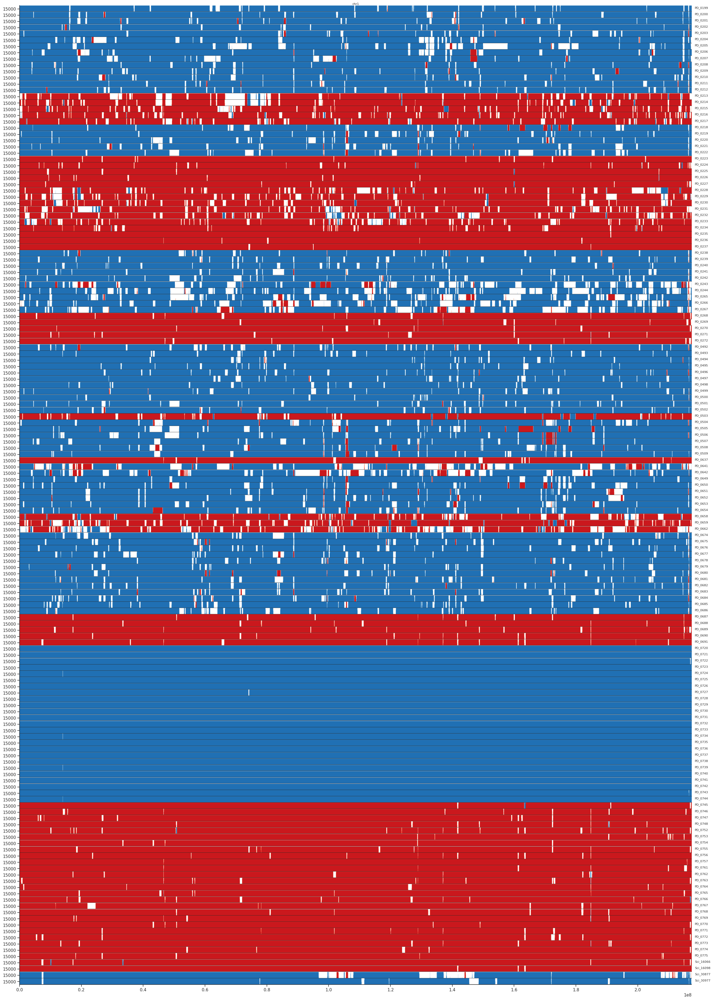

In [47]:
chrtest = mean_df.loc[(mean_df.chrom == "chr1")]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

In [76]:
chrtest = mean_df.loc[(mean_df.chrom == "chr20") & (mean_df.individual.isin(tanzania))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

Done


Done


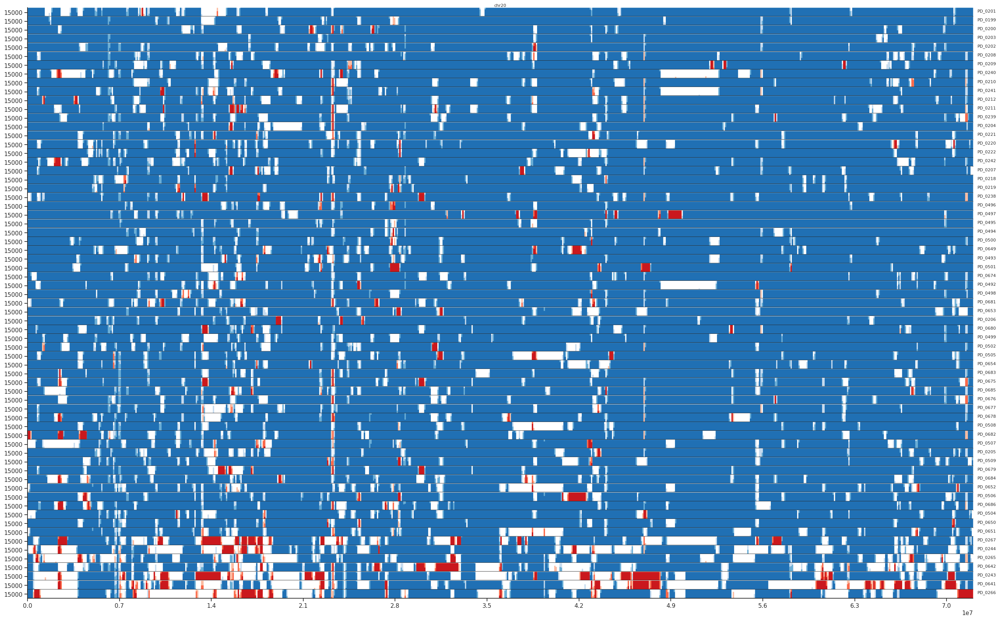

In [78]:
chrtest = mean_df.loc[(mean_df.chrom == "chr20") & (mean_df.individual.isin(olive))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(olive)].individual)
print("Done")

Done


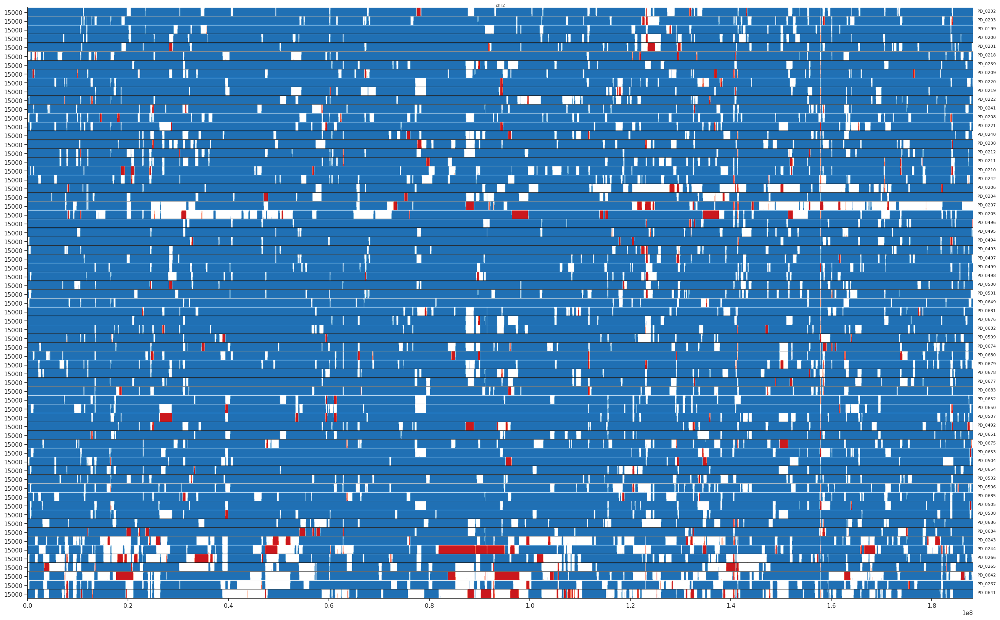

In [20]:
chrtest = mean_df.loc[(mean_df.chrom == "chr2") & (mean_df.individual.isin(olive))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(olive)].individual)
print("Done")

Done


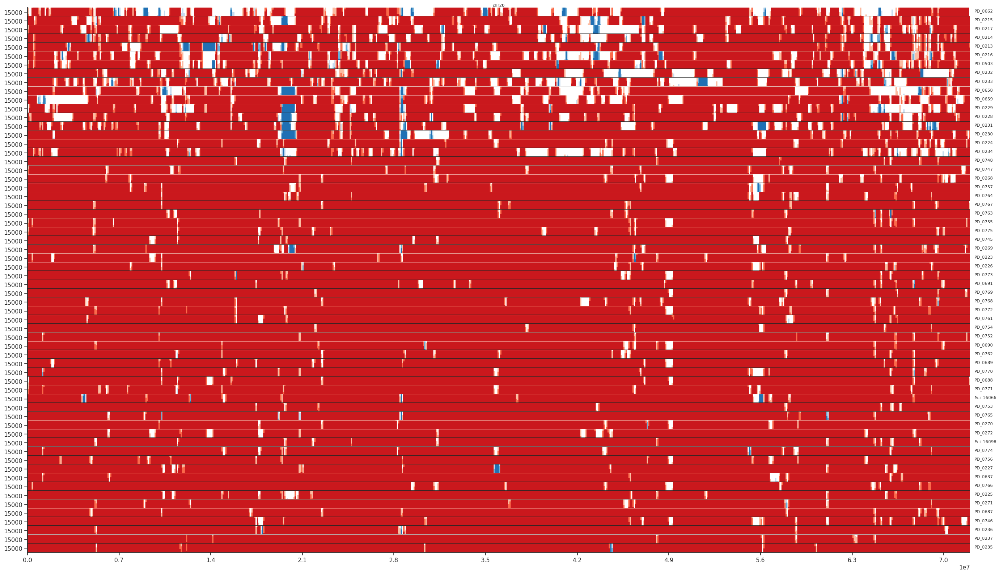

In [80]:
chrtest = mean_df.loc[(mean_df.chrom == "chr20") & (mean_df.individual.isin(yellow))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(yellow)].individual)
print("Done")

Done


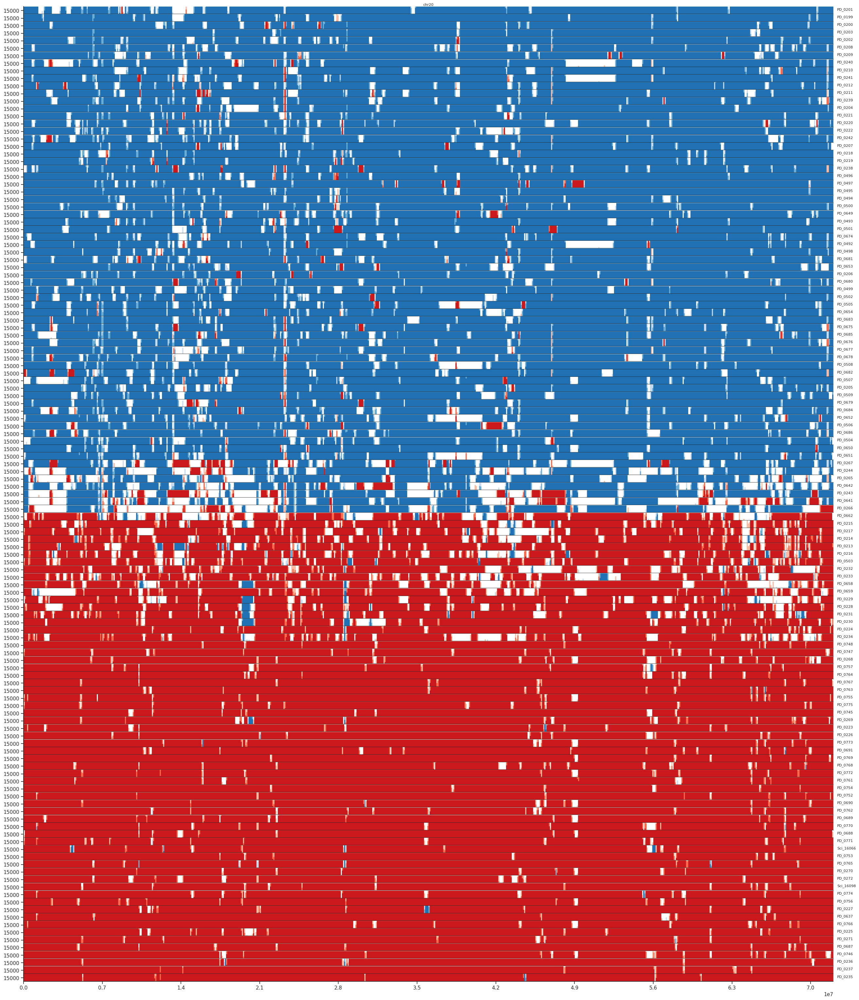

In [81]:
chrtest = mean_df.loc[(mean_df.chrom == "chr20") & (mean_df.individual.isin(tanzania))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

Done


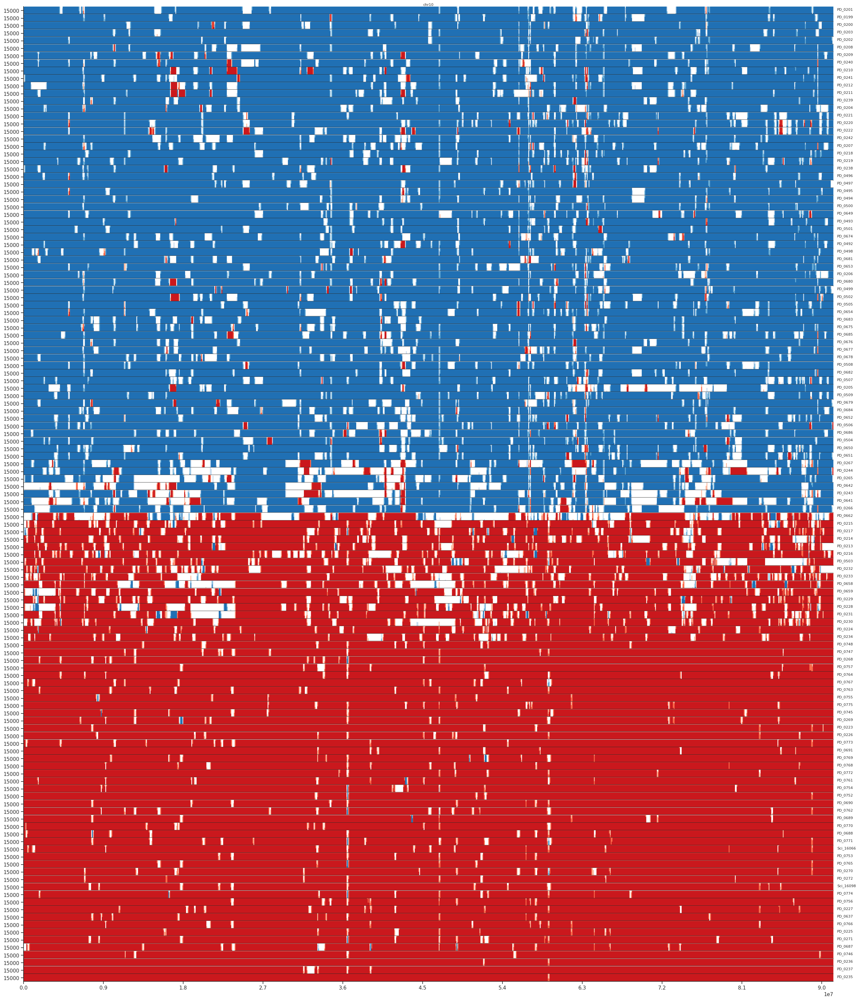

In [87]:
chrtest = mean_df.loc[(mean_df.chrom == "chr10") & (mean_df.individual.isin(tanzania))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.loc[aut_sort.individual.isin(tanzania)].individual)
print("Done")

Done


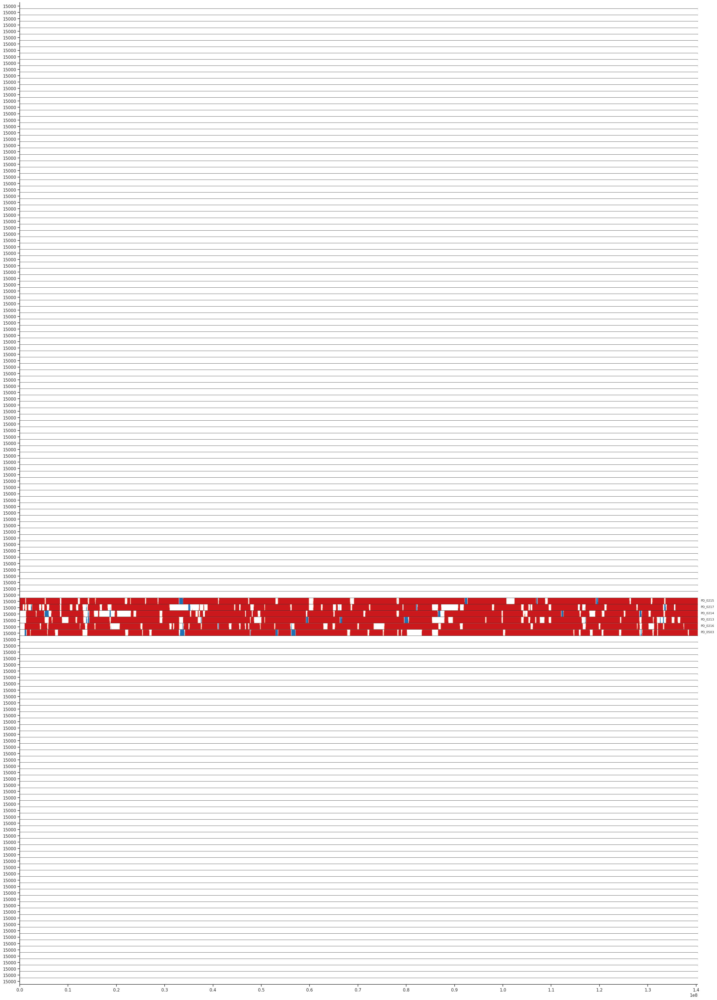

In [58]:
chrtest = mean_df.loc[(mean_df.chrom == "chr8") & (mean_df.individual.isin(ruaha))]
fig = horizonplot(chrtest, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100,
                  pop_sorting=aut_sort.individual)
print("Done")

In [38]:
ruaha = meta_data_samples.loc[meta_data_samples.Origin == "Ruaha, Tanzania"].PGDP_ID

In [40]:
mean_df

,individual,chrom,start,north_sum,north
0,PD_0199,all_chrX,0,0.0,-100000.0
1,PD_0199,all_chrX,100000,0.0,-100000.0
2,PD_0199,all_chrX,200000,0.0,-100000.0
3,PD_0199,all_chrX,300000,0.0,-100000.0
4,PD_0199,all_chrX,400000,0.0,-100000.0
...,...,...,...,...,...
4224870,Sci_30977,female_chrX,143200000,100000.0,100000.0
4224871,Sci_30977,female_chrX,143300000,100000.0,100000.0
4224872,Sci_30977,female_chrX,143400000,100000.0,100000.0
4224873,Sci_30977,female_chrX,143500000,100000.0,100000.0


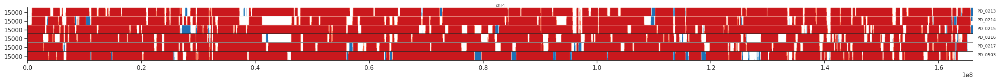

In [41]:
ind_test = mean_df.loc[(mean_df.individual.isin(ruaha)) & (mean_df.chrom == "chr4")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

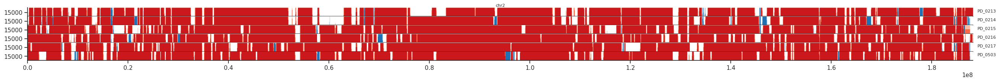

In [42]:
ind_test = mean_df.loc[(mean_df.individual.isin(ruaha)) & (mean_df.chrom == "chr2")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

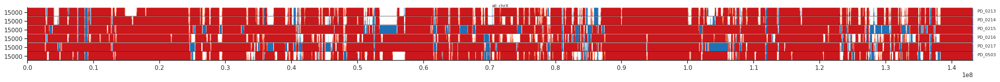

In [43]:
ind_test = mean_df.loc[(mean_df.individual.isin(ruaha)) & (mean_df.chrom == "all_chrX")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

Also running the window conversion on the ethiopian olives

In [37]:
meta_data_samples = pd.read_csv("../data/Papio_metadata_with_clustering_sci.txt", sep =" ")
rfmix_path = "/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/"
mapping_df = pd.read_csv(rfmix_path + "ref_names.txt", sep = "\t", names=["ID", "Origin"])

pop_mapping = {}
o_order = sorted((mapping_df.Origin.unique()))
for o in range(len((mapping_df.Origin.unique()))):
    pop_mapping[o_order[o]] = o

north_south_mapping = {'Hamadryas, Ethiopia': 1,
 'Cynocephalus, Central Tanzania': 0,
 'Papio, Senegal': 0,
 'Anubis, Tanzania': 0}

In [38]:
mapping_df.Origin.unique()

array(['Cynocephalus, Central Tanzania', 'Hamadryas, Ethiopia',
       'Anubis, Tanzania', 'Papio, Senegal'], dtype=object)

In [39]:
df_l = []
for chrom in ["chr{}".format(x) for x in (range(1, 21))]+["all_chrX", "female_chrX"]:
    print(chrom)
    input_file = rfmix_path + "{}.msp.tsv".format(chrom)
    chr_df = pd.read_csv(input_file, sep = "\t", header=1)
    file = open(input_file, 'r')
    line1 = file.readline()
    file.close()
    number_subpop_mapping = {}
    for subpop in line1.strip().split("\t"):
        # Splitting to create lists containing two values - subpop and number.
        subpop_number = subpop.split(": ")[-1].split("=")
        number_subpop_mapping[int(subpop_number[1])] = subpop_number[0]
    for hap in chr_df.columns[6:]:
        paint_df = create_paint_df_ind_compressed(chr_df, hap, number_subpop_mapping, north_south_mapping)
        paint_df["chrom"] = "{}".format(chrom)
        df_l.append(paint_df)
length_df = pd.concat(df_l)

chr1
chr2
chr3
chr4
chr5
chr6
chr7
chr8
chr9
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr20
all_chrX
female_chrX


In [40]:
@window(size=100000)
def north_sum(df):
    return (df.end-df.start).sum()

df_l = []

for c in length_df.chrom.unique():
    output_file = rfmix_path + "{}.windows.txt".format(c)
    print(output_file)
    if os.path.exists(output_file) == False:
        c_df = length_df.loc[(length_df.chrom == c) & (length_df["n/s"] == 1)]
        c_df = c_df.rename(columns={"pos": "start", "end_pos": "end"})
        df = c_df.groupby(['chrom', 'individual', 'haplotype'])[["end", "start"]].apply(north_sum).reset_index(drop=True, level=-1).reset_index()
        df.to_csv(output_file, index=False, sep="\t")

/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr1.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr2.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr3.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr4.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr5.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr6.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr7.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons/steps/rfmix_gen100/eth_olive_focus/chr8.windows.txt
/home/eriks/baboondiversity/people/eriks/second_analysis_baboons

In [41]:
df_l = []
for c in length_df.chrom.unique():
    read_file = rfmix_path + "{}.windows.txt".format(c)
    df = pd.read_csv(read_file, sep="\t")
    df_l.append(df)
window_df_eth = pd.concat(df_l)

In [42]:
mean_df = window_df_eth.groupby(by=["individual", "chrom", "start"])[["north_sum"]].mean().reset_index()
mean_df["north"] = (mean_df.north_sum*2)-100000

In [51]:
window_df_eth

,chrom,individual,haplotype,start,end,north_sum
0,chr1,PD_0228,1,0,100000,0
1,chr1,PD_0228,1,100000,200000,0
2,chr1,PD_0228,1,200000,300000,0
3,chr1,PD_0228,1,300000,400000,0
4,chr1,PD_0228,1,400000,500000,0
...,...,...,...,...,...,...
58612,female_chrX,Sci_34474,1,142100000,142200000,100000
58613,female_chrX,Sci_34474,1,142200000,142300000,100000
58614,female_chrX,Sci_34474,1,142300000,142400000,100000
58615,female_chrX,Sci_34474,1,142400000,142500000,100000


In [52]:
ethiopia = meta_data_samples.loc[meta_data_samples.Origin == "Gog Woreda, Gambella region, Ethiopia"].PGDP_ID
eth_olive_mean_df = mean_df.loc[(mean_df.individual.isin(ethiopia))]

In [53]:
eth_olive_mean_df.groupby(["chrom"])[["north_sum"]].mean()/1000

,north_sum
chrom,
all_chrX,34.379003
chr1,10.089009
chr10,9.176671
chr11,7.385604
chr12,6.438671
chr13,6.599644
chr14,5.985083
chr15,6.793433
chr16,10.506777


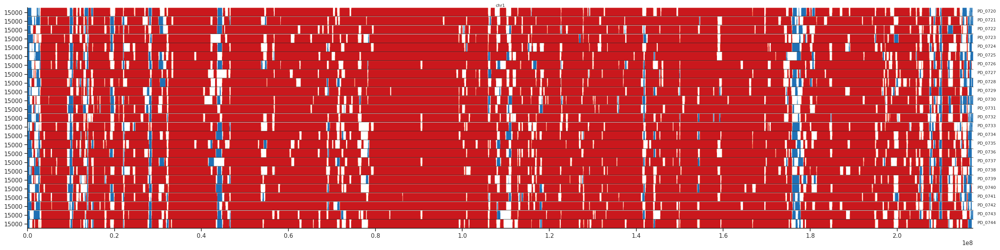

In [54]:
ind_test = mean_df.loc[(mean_df.individual.isin(ethiopia)) & (mean_df.chrom == "chr1")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

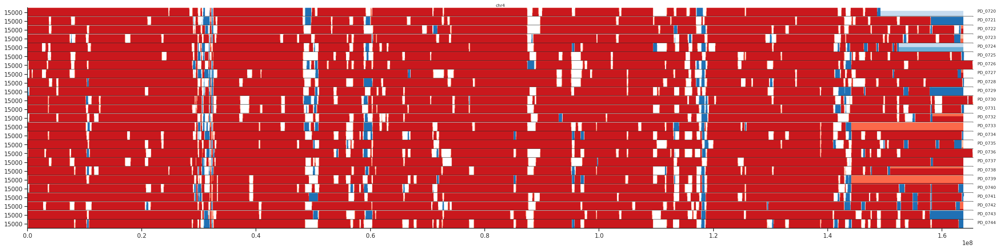

In [45]:
ind_test = mean_df.loc[(mean_df.individual.isin(ethiopia)) & (mean_df.chrom == "chr4")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

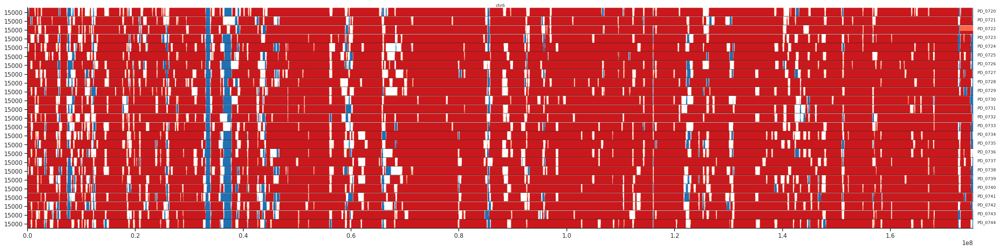

In [46]:
ind_test = mean_df.loc[(mean_df.individual.isin(ethiopia)) & (mean_df.chrom == "chr6")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

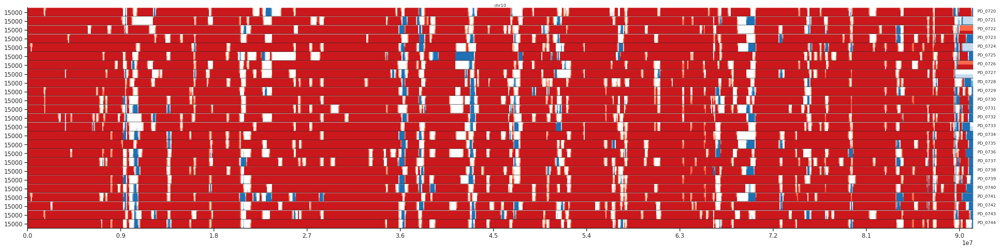

In [70]:
ind_test = mean_df.loc[(mean_df.individual.isin(ethiopia)) & (mean_df.chrom == "chr10")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

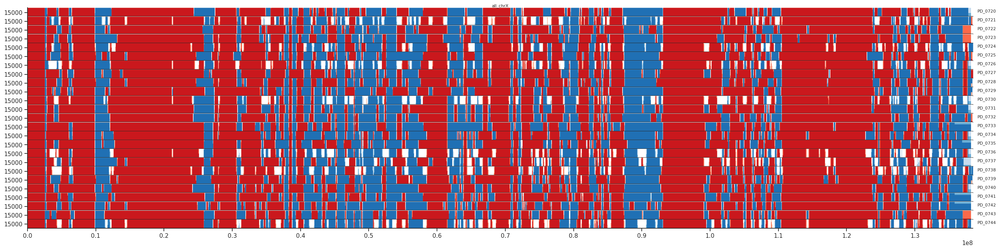

In [68]:
ind_test = mean_df.loc[(mean_df.individual.isin(ethiopia)) & (mean_df.chrom == "all_chrX")]
fig = horizonplot(ind_test, 'north', width=2, col='chrom', row='individual', size=0.3, aspect=100)

In [11]:
c20 = length_df.loc[(length_df.chrom == "chr20") & (length_df["n/s"] == 1)]
c20 = c20.rename(columns={"pos": "start", "end_pos": "end"})
mean_hap_df = c20.groupby(["individual", "chrom", "start", "length"])[["n/s"]].mean().reset_index()
mean_hap_df["windows"] = mean_hap_df.start
mean_hap_df["north"] = mean_hap_df["n/s"]

In [8]:
sampling_locations_c = meta_data_samples.loc[meta_data_samples.Species.isin(["cynocephalus", "anubis"])].C_origin.unique()
sampling_locations_c

array(['Cynocephalus, Central Tanzania', 'Anubis, Kenya',
       'Anubis, Tanzania', 'Cynocephalus, Western Tanzania',
       'Anubis, Ethiopia'], dtype=object)

In [10]:
location_l = []
for sampling_location in sampling_locations_c:
    print(sampling_location)
    samples = meta_data_samples.loc[(meta_data_samples.C_origin == sampling_location)].PGDP_ID
    s_df = length_df.loc[length_df.individual.isin(samples)]
    s_df = s_df.groupby(["chrom", "pos"])[["n/s", "length"]].mean().reset_index()
    s_df["Origin"] = sampling_location    
    location_l.append(s_df)
location_df_all = pd.concat(location_l)

Cynocephalus, Central Tanzania
Anubis, Kenya
Anubis, Tanzania
Cynocephalus, Western Tanzania
Anubis, Ethiopia


In [18]:
autosomes_eastern = location_df_all.loc[(location_df_all.Origin == "Cynocephalus, Central Tanzania") &
                                       (~location_df_all.chrom.isin(["all_chrX", "female_chrX"]))]
autosomes_olive = location_df_all.loc[(location_df_all.Origin == "Anubis, Tanzania") &
                                       (~location_df_all.chrom.isin(["all_chrX", "female_chrX"]))]

[Text(0.5, 0, 'Yellow Minor Parent Ancestry')]

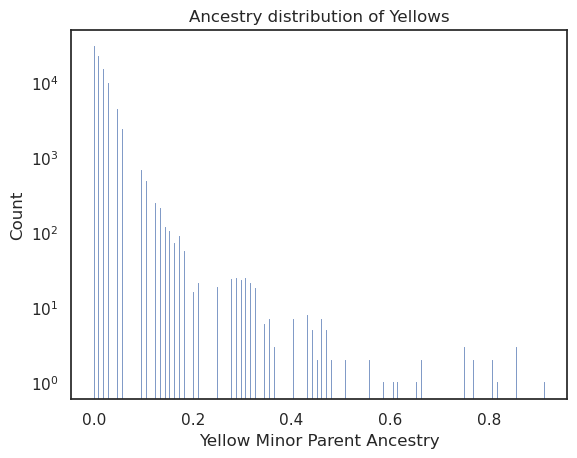

In [22]:
g = sns.histplot(x = autosomes_eastern["n/s"])
plt.yscale('log')
g.set(title="Ancestry distribution of Yellows")
g.set(xlabel="Yellow Minor Parent Ancestry")

In [49]:
autosomes_eastern.loc[(autosomes_eastern["n/s"] > 0.1)]

,chrom,pos,n/s,length,Origin
8198,chr1,46512816,0.144231,30476.0,"Cynocephalus, Central Tanzania"
8199,chr1,46543292,0.153846,30998.0,"Cynocephalus, Central Tanzania"
8200,chr1,46574290,0.125000,728.0,"Cynocephalus, Central Tanzania"
8201,chr1,46575018,0.125000,7359.0,"Cynocephalus, Central Tanzania"
8202,chr1,46582377,0.115385,18293.0,"Cynocephalus, Central Tanzania"
...,...,...,...,...,...
104801,chr9,121646466,0.182692,30906.0,"Cynocephalus, Central Tanzania"
104802,chr9,121677372,0.173077,56368.0,"Cynocephalus, Central Tanzania"
104803,chr9,121733740,0.144231,5679.0,"Cynocephalus, Central Tanzania"
104804,chr9,121739419,0.144231,13706.0,"Cynocephalus, Central Tanzania"


In [50]:
2164/len(autosomes_eastern)

0.022133352425565862

In [51]:
autosomes_olive.loc[(autosomes_olive["n/s"] < 0.9)]

,chrom,pos,n/s,length,Origin
7492,chr1,11593842,0.895522,25139.0,"Anubis, Tanzania"
7493,chr1,11618981,0.895522,32696.0,"Anubis, Tanzania"
7494,chr1,11651677,0.895522,15262.0,"Anubis, Tanzania"
7667,chr1,18171794,0.895522,35909.0,"Anubis, Tanzania"
7668,chr1,18207703,0.895522,49214.0,"Anubis, Tanzania"
...,...,...,...,...,...
105051,chr9,125630597,0.873134,6054.0,"Anubis, Tanzania"
105052,chr9,125636651,0.873134,33459.0,"Anubis, Tanzania"
105053,chr9,125670110,0.895522,5486.0,"Anubis, Tanzania"
105054,chr9,125675596,0.895522,1636.0,"Anubis, Tanzania"


In [52]:
21519/len(autosomes_olive)

0.220095938468462

[Text(0.5, 0, 'Olive Minor Parent Ancestry')]

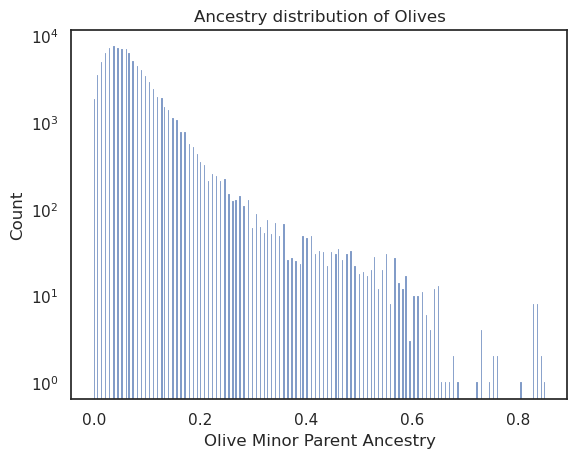

In [24]:
g = sns.histplot(x = 1-autosomes_olive["n/s"])
plt.yscale('log')
g.set(title="Ancestry distribution of Olives")
g.set(xlabel="Olive Minor Parent Ancestry")

In [55]:
from scipy import stats
stats.spearmanr(autosomes_olive["n/s"], 1-autosomes_eastern["n/s"])

SignificanceResult(statistic=0.008643256976638597, pvalue=0.006879531242861342)

[Text(0.5, 0, 'Yellow Major Parent Ancestry'),
 Text(0, 0.5, 'Olive Major Parent Ancestry')]

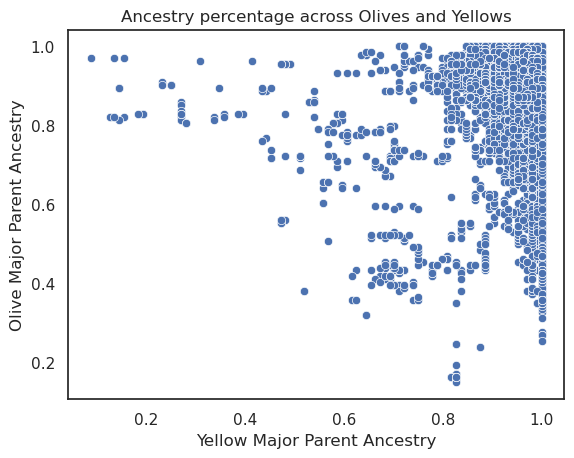

In [54]:
g = sns.scatterplot(y=autosomes_olive["n/s"], x=1-autosomes_eastern["n/s"])
g.set(title="Ancestry percentage across Olives and Yellows")
g.set(xlabel="Yellow Major Parent Ancestry", ylabel="Olive Major Parent Ancestry")

In [6]:
mean_hap_df = length_df.groupby(["individual", "chrom", "pos", "length"])[["n/s"]].mean().reset_index()
mean_hap_df = mean_hap_df.rename(columns={"pos": "start"})
mean_hap_df["windows"] = mean_hap_df.start